**Group information**

| Family name | First name | Email address |
| ----------- | ---------- | ------------- |
|Gómez Argüelles|  Gerardo  |  gerardo.gomez@bse.eu |
|  Tausendschön   |     Oliver  | oliver.tausendschoen@bse.eu  |
|             |            |               |

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Step 0: set up your virtual environment

If usefull, follow the [DIUx-xView/xView2_baseline Github repository environment-setup](https://github.com/DIUx-xView/xView2_baseline#environment-setup) to create a virtual environment (not needed if you run it on Google Colab) and install the packages below:

In [2]:
#Installation of the required packages
!pip install numpy matplotlib tqdm scipy Pillow scikit-image opencv-python
!pip install imgaug IPython geopandas keras imantics simplification scikit-learn
!pip install chainer cup
# Uninstall current pandas completely
!pip uninstall -y pandas

# Install specific pandas version with force-reinstall
!pip install --force-reinstall --no-deps pandas==2.2.3

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 747.0/747.0 kB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 60.0 MB/s eta 0:00:00
  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16009 sha256=e54a256bd6bee709e1666c5c94991564fecf650d901eb05c3053169edcb6cc20
  Stored in directory: /root/.cache/pip/wheels/8c/7e/91/8fba0377906bcb6bf32ce48286924f37bb453a1761ffcf44e1
Successfully built imantics
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.3/227.3 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.4/499.4 kB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 18.8 MB/

## Imports

In [3]:
import re
import os, sys
from imutils import paths
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import imageio

# Step 1: Download the data

While downloading the data below from tier1.zip, read carefully the documentation of the [xView2: Assess Building Damage](https://xview2.org/dataset) and [Gupta et al](https://arxiv.org/pdf/1911.09296.pdf).

The xBD dataset follows this structure:

```  
xBD
 ├── tier1
 │      ├── images
 │      │      └── <image_id>.png
 │      │      └── ...
 │      ├── labels
 │      │      └── <image_id>.json
 │      │      └── ...
 ├── hold
 │      ├── images
 │      │      └── <image_id>.png
 │      │      └── ...
 │      ├── labels
 │      │      └── <image_id>.json
 │      │      └── ...
 ├── test
 │      ├── images
 │      │      └── <image_id>.png
 │      │      └── ...
 │      ├── labels
 │      │      └── <image_id>.json
 │      │      └── ...
 └```
```
to avoid additional heavy downloading, we currently focus only on `/tier1` (it takes a bit of time to run given the size of the dataset).

In [4]:
# download the tier1 part
!wget -O tier1.zip https://www.dropbox.com/scl/fi/pkohmx034xpmcix3w7gf4/tier1.zip?rlkey=ckleil15nslwuc3irvyiqtpfr&st=rbbfdlvb&dl=0
!mkdir xBD
!unzip tier1.zip -d xBD/tier1/
!rm tier1.zip

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: xBD/tier1/tier1/labels/palu-tsunami_00000026_post_disaster.json  
  inflating: xBD/tier1/__MACOSX/tier1/labels/._palu-tsunami_00000026_post_disaster.json  
  inflating: xBD/tier1/tier1/labels/hurricane-michael_00000540_pre_disaster.json  
  inflating: xBD/tier1/__MACOSX/tier1/labels/._hurricane-michael_00000540_pre_disaster.json  
  inflating: xBD/tier1/tier1/labels/hurricane-harvey_00000438_post_disaster.json  
  inflating: xBD/tier1/__MACOSX/tier1/labels/._hurricane-harvey_00000438_post_disaster.json  
  inflating: xBD/tier1/tier1/labels/socal-fire_00001397_pre_disaster.json  
  inflating: xBD/tier1/__MACOSX/tier1/labels/._socal-fire_00001397_pre_disaster.json  
  inflating: xBD/tier1/tier1/labels/socal-fire_00000436_post_disaster.json  
  inflating: xBD/tier1/__MACOSX/tier1/labels/._socal-fire_00000436_post_disaster.json  
  inflating: xBD/tier1/tier1/labels/midwest-flooding_00000346_pre_disaster.json  


Download the `utils` function:

In [5]:
!wget -O utils.zip "https://www.dropbox.com/scl/fi/ofwidtxrasnduljk9i7z0/utils.zip?rlkey=v9y0b0fmftw5y8z3kz2yvbbu2&st=krwaqpze&dl=1"
!unzip utils.zip -d utils/
!rm utils.zip


--2025-05-04 09:39:23--  https://www.dropbox.com/scl/fi/ofwidtxrasnduljk9i7z0/utils.zip?rlkey=v9y0b0fmftw5y8z3kz2yvbbu2&st=krwaqpze&dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ucec61ec85b424f09f17671cea89.dl.dropboxusercontent.com/cd/0/inline/CpBMFhnUuKaLXZYOLoWuT4e7L-hKSWEDE4F-UgfPp9WimGvXMRmNr8HGu333AnO-6P1epKtZm_QA_fhHSXdqQGdRtzQMrBAvn_cQc1TDZXvq558acxLlmxj5P5LTvBuKvRY6VAfIublzIrr9Luo2gZL0/file?dl=1# [following]
--2025-05-04 09:39:24--  https://ucec61ec85b424f09f17671cea89.dl.dropboxusercontent.com/cd/0/inline/CpBMFhnUuKaLXZYOLoWuT4e7L-hKSWEDE4F-UgfPp9WimGvXMRmNr8HGu333AnO-6P1epKtZm_QA_fhHSXdqQGdRtzQMrBAvn_cQc1TDZXvq558acxLlmxj5P5LTvBuKvRY6VAfIublzIrr9Luo2gZL0/file?dl=1
Resolving ucec61ec85b424f09f17671cea89.dl.dropboxusercontent.com (ucec61ec85b424f09f17671cea89.dl.dropboxusercontent.c

## Data preparation

1. Run `utils/split_into_disasters.py` on folder `/tier1` to split files under a single directory (with images/ and labels/ into directory of disasters/images|labels) like this:
```  
xBD
 ├── disaster_name_1
 │      ├── images
 │      │      └── <image_id>.png
 │      │      └── ...
 │      ├── labels
 │      │      └── <image_id>.json
 │      │      └── ...
 ├── disaster_name_2
 │      ├── images
 │      │      └── <image_id>.png
 │      │      └── ...
 │      ├── labels
 │      │      └── <image_id>.json
 │      │      └── ...
 └── disaster_name_n
```  
Check the parameter required by calling:

`!python /content/utils/utils/split_into_disasters.py --help`

In [11]:
import os

os.getcwd()

'/content'

In [7]:
!python3 utils/utils/split_into_disasters.py \
    --input "xBD/tier1/tier1" \
    --output "xBD/train"


We can now delete the `tier1` to save space:

In [8]:
!rm -r xBD/tier1/

2. Run the `utils/generate_annotation_masks.py` to generate a mask file for the chipped images given the json file in the /labels folder.

Check the parameter required by calling:

`$ python generate_annotation_masks.py --help` (it is a slow process).

In [12]:
!python3 utils/utils/generate_annotation_masks.py \
    --input xBD/train


dirs ['xBD/train/hurricane-matthew', 'xBD/train/hurricane-michael', 'xBD/train/guatemala-volcano', 'xBD/train/hurricane-florence', 'xBD/train/midwest-flooding', 'xBD/train/palu-tsunami', 'xBD/train/mexico-earthquake', 'xBD/train/socal-fire', 'xBD/train/santa-rosa-wildfire', 'xBD/train/hurricane-harvey']
Time: 6.268 min


The data folders should now look like this:
```
/path/to/xBD/train
├── guatemala-volcano
│   ├── images
│   ├── labels
│   └── masks
├── hurricane-florence
│   ├── images
│   ├── labels
│   └── masks
├── hurricane-harvey
│   ├── images
│   ├── labels
│   └── masks
├── hurricane-matthew
│   ├── images
│   ├── labels
│   └── masks
├── hurricane-michael
│   ├── images
│   ├── labels
│   └── masks
├── mexico-earthquake
│   ├── images
│   ├── labels
│   └── masks
├── midwest-flooding
│   ├── images
│   ├── labels
│   └── masks
├── palu-tsunami
│   ├── images
│   ├── labels
│   └── masks
├── santa-rosa-wildfire
│   ├── images
│   ├── labels
│   └── masks
├── socal-fire
│   ├── images
│   ├── labels
└   └── masks
```          

# Step 2: Investigate the data

In [13]:
import os
os.chdir(r"xBD")


In [14]:
all_image_paths = list(paths.list_images("train"))
print(f"Total images: {int(len(all_image_paths))/2}")

Total images: 5598.0


In [15]:
image_ids = {path.split("/")[1] for path in all_image_paths}
print(len(image_ids))
image_ids

10


{'guatemala-volcano',
 'hurricane-florence',
 'hurricane-harvey',
 'hurricane-matthew',
 'hurricane-michael',
 'mexico-earthquake',
 'midwest-flooding',
 'palu-tsunami',
 'santa-rosa-wildfire',
 'socal-fire'}

3. Implement a function `get_image_paths` that takes as an input the `image_id` and return the `image_paths` and `masks_paths`.

In [16]:
def get_image_paths(image_id=int):
    base_path= "train"
    all_image_paths = list(paths.list_images(base_path))
    image_paths=[]
    for path in all_image_paths:
        if image_id in path:
            image_paths.append(path)
    if len(image_paths) > 0:
        return image_paths
    else:
        return None

In [17]:
get_image_paths("00000001")

['train/hurricane-matthew/masks/hurricane-matthew_00000001_post_disaster.png',
 'train/hurricane-matthew/masks/hurricane-matthew_00000001_pre_disaster.png',
 'train/hurricane-matthew/images/hurricane-matthew_00000001_post_disaster.png',
 'train/hurricane-matthew/images/hurricane-matthew_00000001_pre_disaster.png',
 'train/hurricane-michael/masks/hurricane-michael_00000001_post_disaster.png',
 'train/hurricane-michael/masks/hurricane-michael_00000001_pre_disaster.png',
 'train/hurricane-michael/images/hurricane-michael_00000001_post_disaster.png',
 'train/hurricane-michael/images/hurricane-michael_00000001_pre_disaster.png',
 'train/guatemala-volcano/masks/guatemala-volcano_00000001_post_disaster.png',
 'train/guatemala-volcano/masks/guatemala-volcano_00000001_pre_disaster.png',
 'train/guatemala-volcano/images/guatemala-volcano_00000001_post_disaster.png',
 'train/guatemala-volcano/images/guatemala-volcano_00000001_pre_disaster.png',
 'train/hurricane-florence/masks/hurricane-florence_

4. Show the number of pre-images, post-images, pre-masks, post-mask per disaster-type.

In case of error like `TypeError: Cannot convert numpy.ndarray to numpy.ndarray`, use [tabulate](https://github.com/astanin/python-tabulate) instead of [pd.DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html).


Hint: the below expression might suggest a usefull syntax:

```
int(len([f for f in image_paths if "_pre_" in f  ]))
```



In [18]:
base_path = "train"
disasters = os.listdir("train")
for disaster in disasters:
    image_dir = os.path.join(base_path, disaster, "images")
    mask_dir = os.path.join(base_path, disaster, "masks")

    image_files = list(paths.list_images(image_dir))
    mask_files = list(paths.list_images(mask_dir))
    pre = int(len([f for f in image_files if "_pre_" in f]))
    post = int(len([f for f in image_files if "_post_" in f]))
    pre_mask = int(len([f for f in mask_files if "_pre_" in f]))
    post_mask = int(len([f for f in mask_files if "_post_" in f]))
    print(f"NUmber of pre-Images of {disaster}:{pre}")
    print(f"NUmber of post-Images of {disaster}:{post}")
    print(f"NUmber of pre-Masks of {disaster}:{pre_mask}")
    print(f"NUmber of post-Masks of {disaster}:{post_mask}")



NUmber of pre-Images of hurricane-matthew:238
NUmber of post-Images of hurricane-matthew:238
NUmber of pre-Masks of hurricane-matthew:238
NUmber of post-Masks of hurricane-matthew:238
NUmber of pre-Images of hurricane-michael:343
NUmber of post-Images of hurricane-michael:343
NUmber of pre-Masks of hurricane-michael:343
NUmber of post-Masks of hurricane-michael:343
NUmber of pre-Images of guatemala-volcano:18
NUmber of post-Images of guatemala-volcano:18
NUmber of pre-Masks of guatemala-volcano:18
NUmber of post-Masks of guatemala-volcano:18
NUmber of pre-Images of hurricane-florence:319
NUmber of post-Images of hurricane-florence:319
NUmber of pre-Masks of hurricane-florence:319
NUmber of post-Masks of hurricane-florence:319
NUmber of pre-Images of midwest-flooding:279
NUmber of post-Images of midwest-flooding:279
NUmber of pre-Masks of midwest-flooding:279
NUmber of post-Masks of midwest-flooding:279
NUmber of pre-Images of palu-tsunami:113
NUmber of post-Images of palu-tsunami:113
N

## Visualization

In [19]:
pre_image_paths = [path for path in all_image_paths if ("images" in path)and ("_pre_" in path) and ("ipynb_checkpoints" not in path)]
post_image_paths = [path for path in all_image_paths if ("images" in path)and ("_post_" in path) and ("ipynb_checkpoints" not in path)]
pre_mask_label_paths = [path for path in all_image_paths if ("masks" in path) and ("_pre_" in path) and ("ipynb_checkpoints" not in path)]
post_mask_label_paths=[path for path in all_image_paths if ("masks" in path) and ("_post_" in path) and ("ipynb_checkpoints" not in path)]
len(pre_image_paths), len(post_image_paths), len(pre_mask_label_paths), len(post_mask_label_paths)

(2799, 2799, 2799, 2799)

In [20]:
regex = r"\D*\d+"
compiler = re.compile(regex)

def get_intensity(path):
  if sys.platform == 'win32':
    return compiler.search(path).group().split("\\")[-1]
  if sys.platform == 'linux':
    return compiler.search(path).group().split("/")[-1]

Before completing question 5, check the code `generate_annotation_masks.py` to familiarize with the structure of the labels. Hint: check the `mask_for_polygon function`.

5. Read the `pre_mask_label_paths` and `post_mask_label_paths` with [imageio.imread()](https://imageio.readthedocs.io/en/stable/_autosummary/imageio.v3.imread.html) and use [np.unique()](https://numpy.org/doc/stable/reference/generated/numpy.unique.html) to investigate how many value are usually present in the masks (both pre- and post-). Do you notice any incongruity between what you got and the Line 45-51 of the `generate_annotation_masks.py`:
```
damage_dict = {
    "no-damage": 1,
    "minor-damage": 2,
    "major-damage": 3,
    "destroyed": 4,
    "un-classified": 255
}
```

In [21]:
import imageio.v3 as imageio
import numpy as np

for i in range(0,10):
    print(np.unique(imageio.imread(pre_mask_label_paths[0])))
    print(np.unique(imageio.imread(post_mask_label_paths[0])))
#print((imageio.imread(pre_image_paths[0])))



[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]
[0]
[  0   1   2 255]


From this output, we can see how we strangely don't have any 255 values. They might just not be present in the corresponding samples but it seems that this is not the case after looping through many cases. After reading the documentation, we conclude:

Initially, loading masks without specifying the argument 'mode' returnes a 3D array because imageio assumes PNGs are RGB by default. This causes class values like 255 to disappear or be misrepresented.

We theirfor use the following code, clearing up this confusion:

In [22]:
for i in range(0, 10):
    print(np.unique(imageio.imread(pre_mask_label_paths[i], mode='L')))
    print(np.unique(imageio.imread(post_mask_label_paths[i], mode='L')))


[0]
[  0   1   2 255]
[0 1]
[  0   2   3 255]
[0 1]
[  0   4 255]
[0 1]
[0 1 2]
[0 1]
[0 2 3]
[0 1]
[0 2 3 4]
[0 1]
[  0   1   2   3   4 255]
[0 1]
[0 3 4]
[0 1]
[0]
[0 1]
[  0   1   2   3   4 255]


6. Implement a function `show_all_three_images` (similar to the one in `Lab_01_data_preparation.ipynb`) that uses the function [imageio.imread()](https://imageio.readthedocs.io/en/stable/_autosummary/imageio.v3.imread.html) to load the tif files. Remember to first install the packages and then import them.

    **Please ensure that ALL classes are displayed carefully.**

    Hint: to display the classes in different colours you can use [matplotlib.colors.ListedColormap](https://matplotlib.org/stable/api/_as_gen/matplotlib.colors.ListedColormap.html).

In [37]:
from typing import List
import imageio.v3 as imageio
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg
import numpy as np
import os

def show_all_three_images(filenames: List[str], titles: List[str]) -> None:
    if len(filenames) != len(titles):
        raise ValueError("The number of filenames and titles must be the same.")
    if len(filenames) > 3:
        raise ValueError("This function is designed to show only three images at a time.")
    if len(filenames) == 0:
        raise ValueError("No filenames provided.")
    if len(titles) == 0:
        raise ValueError("No titles provided.")
    if len(filenames) != len(titles):
        raise ValueError("The number of filenames and titles must be the same.")

    num_images = len(filenames)
    columns = 3
    rows = 1

    fig = plt.figure(figsize=(5 * columns, 5 * rows))
    plt.suptitle(os.path.basename(filenames[0]).split("_")[0], size=16)

    # Define class names and colors
    class_names = ['Background', 'No damage', 'Minor damage', 'Major damage', 'Destroyed', 'Unclassified']
    class_colors = ['black', 'blue', 'yellow', 'orange', 'red', 'purple']
    cmap = ListedColormap(class_colors)

    for i, (filename, title) in enumerate(zip(filenames, titles)):
        ax = plt.subplot(rows, columns, i + 1)

        # If it's the mask, read in grayscale and apply class color map
        if "masks" in filename:
            mask = imageio.imread(filename, mode='L')
            # Replace 255 with 5 for colormap indexing
            mask = np.where(mask == 255, 5, mask)
            im = ax.imshow(mask, cmap=cmap, vmin=0, vmax=5)

            # Create a dedicated legend for the mask image
            if i == 2:
                # Create custom legend
                import matplotlib.patches as mpatches
                legend_patches = [mpatches.Patch(color=color, label=name)
                                 for color, name in zip(class_colors, class_names)]

                # Add legend to the figure
                fig.legend(handles=legend_patches,
                          loc='lower center',
                          bbox_to_anchor=(0.5, 0.01),
                          ncol=6,
                          fontsize='small')
        else:
            img = imageio.imread(filename)
            ax.imshow(img)

        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.14)
    plt.show()


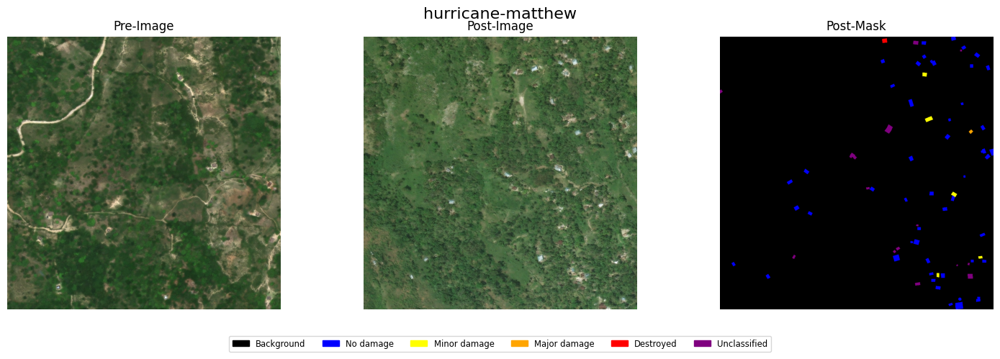

In [38]:
show_all_three_images([pre_image_paths[9], post_image_paths[9], post_mask_label_paths[9]],
                    ["Pre-Image", "Post-Image", "Post-Mask"])

7. Plot some "Pre-disaster image" (png), "Post-disaster image" (png) , and "Post-Disaster Label" (png).

    Hint: `mask_label_paths` includes both pre- and post-disaster images, use `post_mask_label_paths` for your for loop. A useful function can be `.replace()`, for example:

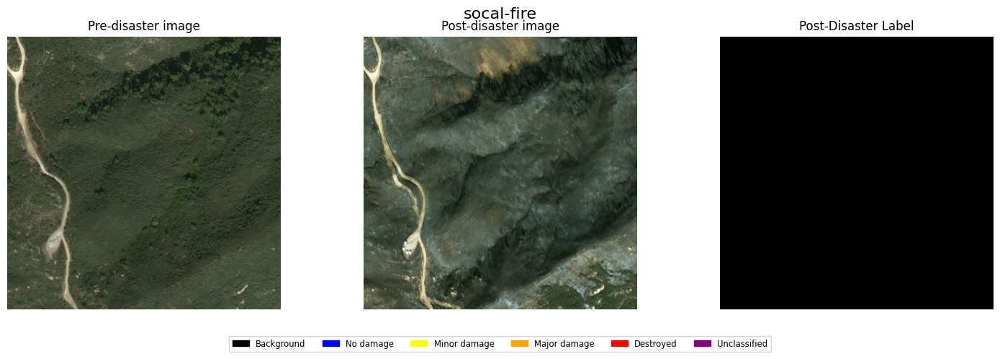

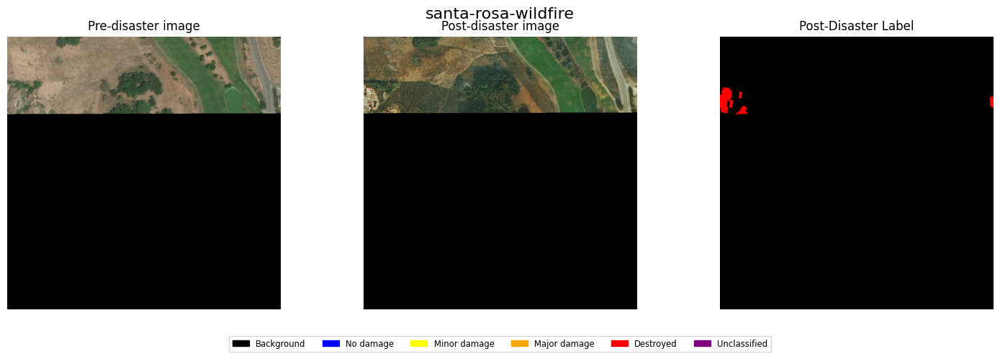

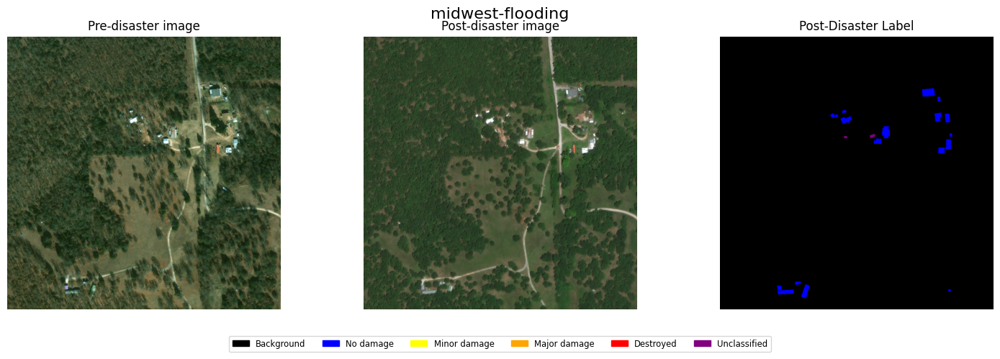

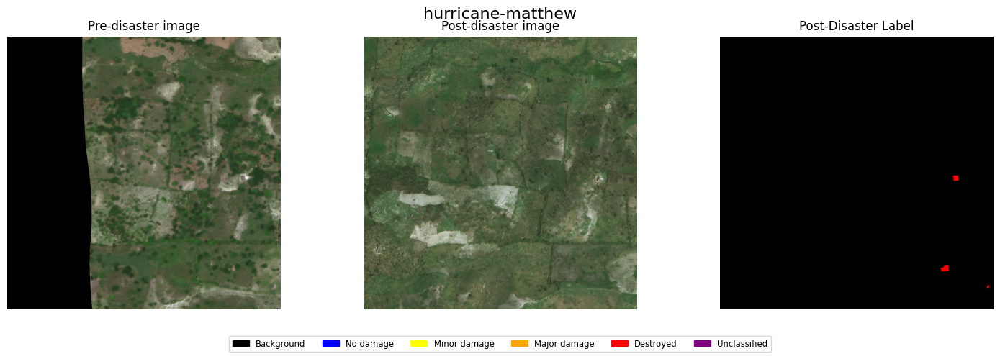

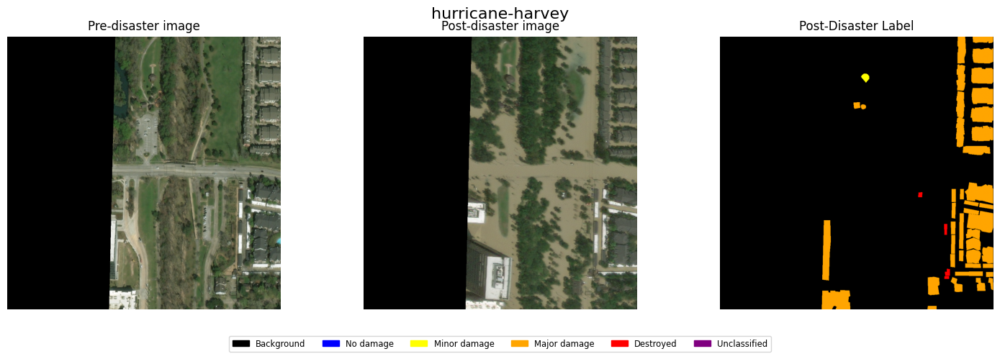

...

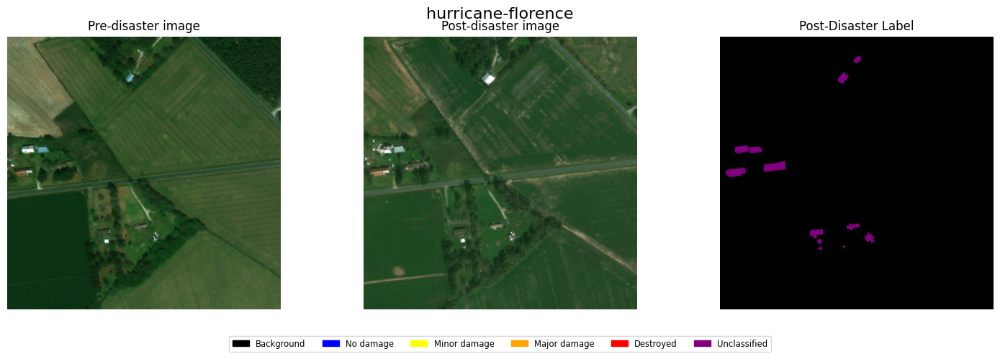

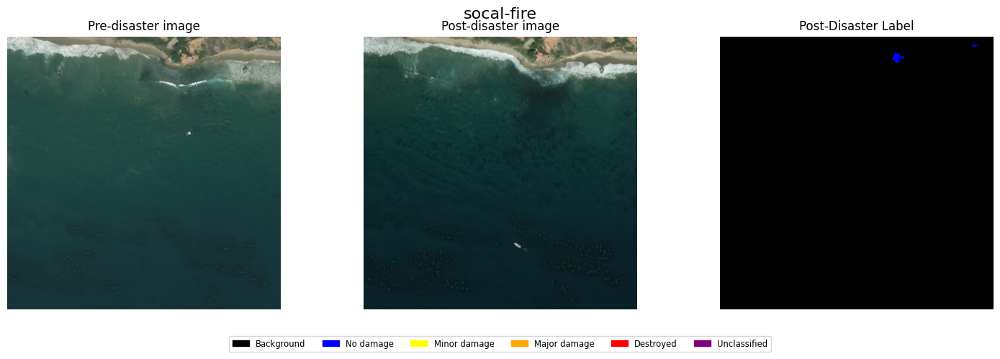

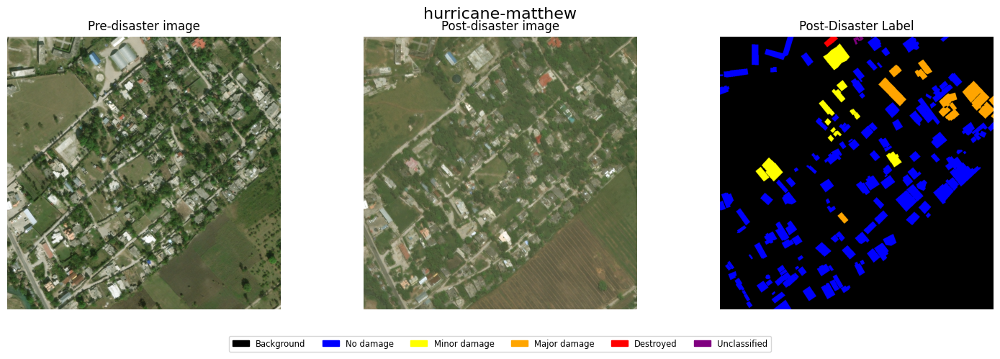

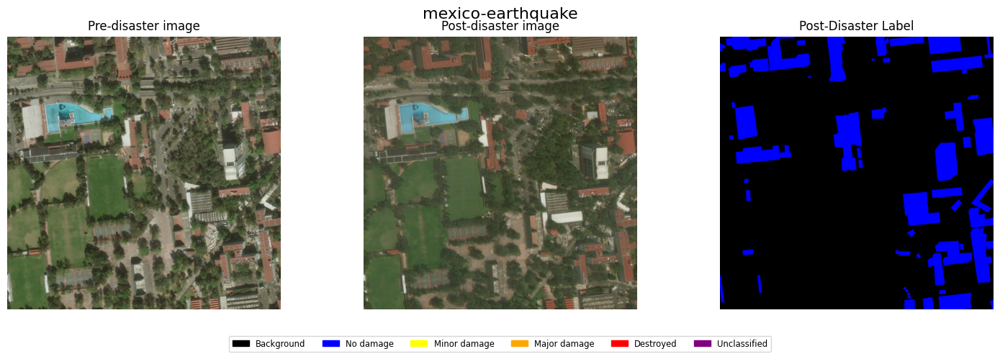

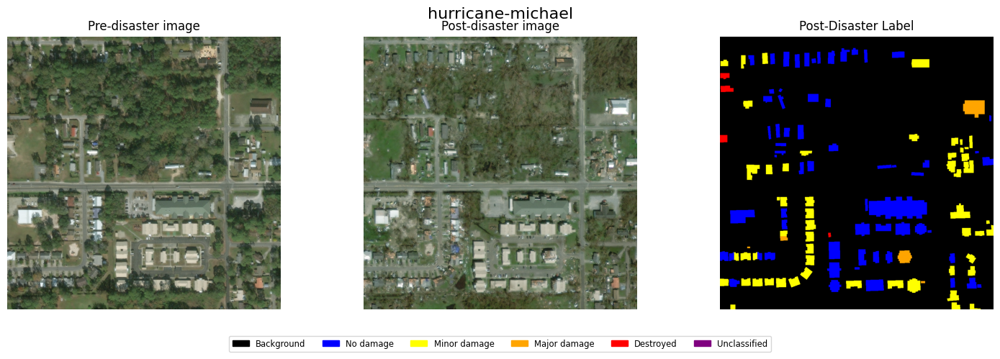

In [40]:
import random
titles = ["Pre-disaster image","Post-disaster image" , "Post-Disaster Label" ]
random_index =  random.sample(range(0, len(post_mask_label_paths)), 15)

for i in random_index:
    post_mask_path = post_mask_label_paths[i]

    pre_image_path = post_mask_path.replace("masks", "images").replace("_post_disaster.png", "_pre_disaster.png")
    post_image_path = post_mask_path.replace("masks", "images")

    show_all_three_images(
        filenames=[pre_image_path, post_image_path, post_mask_path],
        titles=titles
    )

## Step 3: Class Distribution

8. Create a histogram illustrating the distribution of the pixels in the different classes.

Counting pixels per class: 100%|██████████| 2799/2799 [01:07<00:00, 41.45it/s]


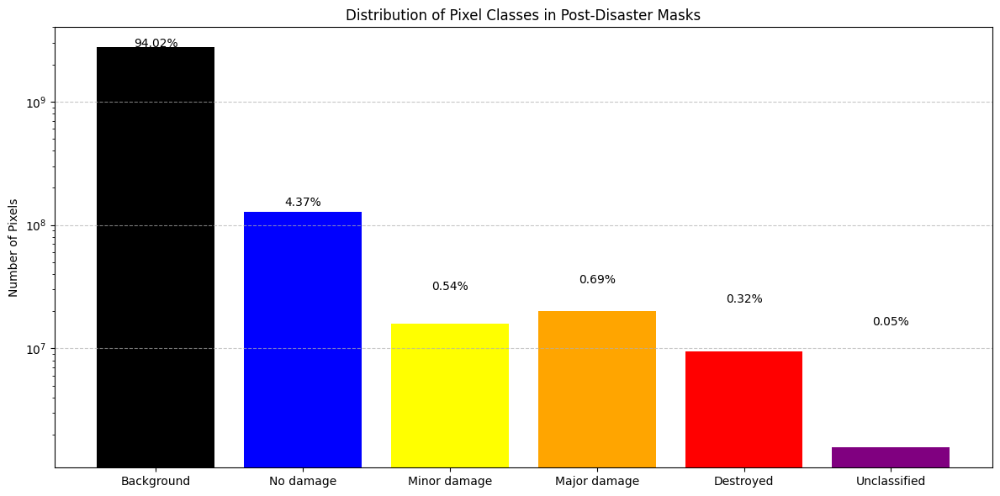

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Class names:
class_names = {
    0: 'Background',
    1: 'No damage',
    2: 'Minor damage',
    3: 'Major damage',
    4: 'Destroyed',
    5: 'Unclassified'
}

# Dictionary to count pixels per class
class_counts = {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0}

sample_post_masks = post_mask_label_paths

# Count pixels per class
for mask_path in tqdm(sample_post_masks, desc="Counting pixels per class"):
    mask = imageio.imread(mask_path, mode='L')
    mask = np.where(mask == 255, 5, mask)
    unique, counts = np.unique(mask, return_counts=True)
    for u, c in zip(unique, counts):
        if u in class_counts:
            class_counts[u] += c

# Converting to percentages
total_pixels = sum(class_counts.values())
class_percentages = {k: (v / total_pixels) * 100 for k, v in class_counts.items()}

# Data for plotting
class_keys = sorted(class_counts.keys())
class_values = [class_counts[k] for k in class_keys]
class_labels = [class_names[k] for k in class_keys]

# Bar plot
plt.figure(figsize=(12, 6))
colors = ['black', 'blue', 'yellow', 'orange', 'red', 'purple']  # Match the visualization colors
bars = plt.bar(class_labels, class_values, color=colors)

# Percentage labels above bars
for bar, percentage in zip(bars, [class_percentages[k] for k in class_keys]):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 0.5 * max(class_values)/100,
        f'{percentage:.2f}%',
        ha='center',
        fontsize=10
    )

plt.title('Distribution of Pixel Classes in Post-Disaster Masks')
plt.ylabel('Number of Pixels')
plt.yscale('log')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
